### purpose

explore how environments are correlated with population structure, and how this correlation relates to performance.

In [1]:
from pythonimports import *
import myfigs as mf

import MVP_summary_functions as mvp
import MVP_06_validate_RONA as mvp06

from matplotlib import cm
import seaborn as sns
plt.rcParams.update({'font.family' : 'serif'})
fancy_env = {'sal_opt' : '$\itEnv2$', 'temp_opt' : '$\ittemp$'}

lview, dview = get_client(cluster_id='1706572272-ne39', profile='lotterhos')

t0 = dt.now()  # notebook timer

summarydir = '/home/b.lind/offsets/run_20220919/summaries'
figdir = makedir(f'{summarydir}/10_supplemental/03_PC_correlations')

mvp.latest_commit()
session_info.show()

36 36
#########################################################
Today:	January 29, 2024 - 18:58:54 EST
python version: 3.8.5
conda env: mvp_env

Current commit of pythonimports:
commit 419895d157c97717f835390196c13cf973d25eba  
Merge: e20434f 1e09b6c  
Author: Brandon Lind <lind.brandon.m@gmail.com>

Current commit of MVP_offsets:
commit b81dc95b6b857f0ed2229f1e1ab2b8546f6964ce  
Author: Brandon Lind <lind.brandon.m@gmail.com>  
Date:   Mon Jan 29 18:43:39 2024 -0500
#########################################################



# get metadata

In [2]:
# get seed numbers for 2-trait sims
params = mvp.read_params_file()

two_trait_seeds = params[params.plevel == '2-trait'].index.to_list()

len(two_trait_seeds)

100%|███████████████| 2250/2250 [00:02<00:00, 876.91it/s]


1800

### establish convention for landscape x selection strenght color/shape

In [3]:
def change_markers(g, data=None, hue=None, marker_by=None, color_map=None, marker_map=None):
    """Update marker shape from a seaborn figure output, `g`."""
    from matplotlib.collections import PathCollection, PolyCollection
    from matplotlib.markers import MarkerStyle
    from matplotlib.lines import Line2D
    
    for ax in g.axes[0]:
        for collection in ax.collections:
            if isinstance(collection, PathCollection):
                hue_level = collection.get_label()
                levels = data[data[hue] == hue_level][hue].to_list()

                if marker_map is not None:
                    paths = [
                        MarkerStyle(
                            mvp.markers[level if marker_map is None else marker_map[level]]
                        ).get_path() for level in levels
                    ]

                if color_map is not None:
                    collection.set_edgecolors(color_map[hue_level])

                collection.set_paths(paths)
                collection.set_sizes([15])

#         for i, line in enumerate(ax.get_lines()):
#             if isinstance(line, Line2D) and color_map is not None:
#                 hue_level = ax.get_legend_handles_labels()[1][i]
#                 line.set_color(color_map[hue_level])
    pass

In [4]:
# get a list of paired colors
all_colors = sns.color_palette("Paired")
colors = all_colors[2:4] + all_colors[-6:-2]
for color in colors:
    print(ColorText('color').custom(color).bold())

color
color
color
color
color
color


In [5]:
all_colors

[(0.6509803921568628, 0.807843137254902, 0.8901960784313725),
 (0.12156862745098039, 0.47058823529411764, 0.7058823529411765),
 (0.6980392156862745, 0.8745098039215686, 0.5411764705882353),
 (0.2, 0.6274509803921569, 0.17254901960784313),
 (0.984313725490196, 0.6039215686274509, 0.6),
 (0.8901960784313725, 0.10196078431372549, 0.10980392156862745),
 (0.9921568627450981, 0.7490196078431373, 0.43529411764705883),
 (1.0, 0.4980392156862745, 0.0),
 (0.792156862745098, 0.6980392156862745, 0.8392156862745098),
 (0.41568627450980394, 0.23921568627450981, 0.6039215686274509),
 (1.0, 1.0, 0.6),
 (0.6941176470588235, 0.34901960784313724, 0.1568627450980392)]

In [6]:
mvp.factor_names['landscape_slevel_all'] = 'Landscape x Selection Strength'

params['landscape_slevel_all'] = params['landscape'] + '_' + params['slevel']
# params['landscape_slevel_all_glevel'] = params['landscape_slevel_all'] + '_' + params['glevel']

levels = params['landscape_slevel_all'][params['landscape_slevel_all'].notnull()].unique()

# update dicts
palette = {}
mvp.hue_order['landscape_slevel_all'] = []
for i, level in enumerate(sorted(levels)):
    if level == level:  # exclude 1-trait nan
        landscape, slevel = level.split("_")
        mvp.factor_names[level] = f'{mvp.factor_names[landscape]} {mvp.factor_names[slevel]}'
        mvp.hue_order['landscape_slevel_all'].append(level)
        mvp.markers[level] = mvp.markers[landscape]
        palette[level] = colors[i]
        print(ColorText(level).custom(colors[i]).bold())

Est-Clines_equal-S
Est-Clines_unequal-S
SS-Clines_equal-S
SS-Clines_unequal-S
SS-Mtn_equal-S
SS-Mtn_unequal-S


# get PC data

In [7]:
# get PCA projection files for 2-trait sims
pca_files = []
for repdir in pbar(mvp.repdirs):
    pcadirs = fs(f'{repdir}/pca/pca_output', endswith='.pca', dirs=True)
    assert len(pcadirs) == 225

    new_files = []
    for d in pcadirs:
        basename = op.basename(d).split('.')[0]
        
        seed = basename.split("_")[0]
        
        if seed in two_trait_seeds:
            new_files.append(f'{d}/{basename}.projections')
    
    assert len(new_files) == 180
    
    pca_files.extend(new_files)
    
assert len(pca_files) == 1800

100%|███████████████| 10/10 [00:00<00:00, 15.50it/s]


# calc correlations of envs with PC axes

In [8]:
[x for x in range(1, 11, 1)]

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [9]:
def env_pc_correlation(f, last_axis=2):
    """Calculate correlation between each env and the first two PC axes."""
    import MVP_summary_functions as mvp
    import MVP_06_validate_RONA as mvp06
    from os import path as op
    import pandas as pd
    from collections import defaultdict
    
    seed = op.basename(f).split("_")[0]
    
    projections = pd.read_table(f, delim_whitespace=True, header=None)
    projections.index = range(1, 101, 1)
    
    subset, locations, envdata = mvp06.get_pop_data(mvp.slimdir, seed)
    
    correlations = defaultdict(dict)
    for env in envdata.columns:
        for pc in projections.columns[:last_axis]:
            correlations[env][pc + 1] = projections[pc].corr(envdata[env], method='pearson')
    
    return correlations

In [10]:
jobs = []
for f in pca_files:
    jobs.append(
        lview.apply_async(
            env_pc_correlation, f
        )
    )
    
watch_async(jobs)


Watching 1800 jobs ...


100%|███████████████| 1800/1800 [00:13<00:00, 137.86it/s]


In [11]:
# gather jobs
correlations = {}
for i, f in enumerate(pca_files):
    seed = op.basename(f).split("_")[0]
    
    correlations[seed] = pd.DataFrame(jobs[i].r)
    
len(correlations)

1800

In [12]:
# example value for the last seed
correlations[seed]

,sal_opt,temp_opt
1,-0.114567,-0.811719
2,-0.285001,-0.398595


In [13]:
# put everything into one dataframe
corr_df = pd.concat(correlations.values()).reset_index(drop=False)\

corr_df.columns = ['PC'] + corr_df.columns[1:].tolist()

corr_df.index = flatten([[seed, seed] for seed in correlations])

corr_df

,PC,sal_opt,temp_opt
1231109,1,0.001362,-0.994742
1231109,2,0.019975,0.013617
1231110,1,0.000215,-0.987643
1231110,2,-0.001239,-0.096827
1231111,1,0.001207,-0.982495
...,...,...,...
1233341,2,0.015762,-0.006554
1233342,1,0.006266,-0.039251
1233342,2,-0.024856,-0.977396
1233343,1,-0.114567,-0.811719


In [14]:
def stacked_bar(pc=1, env='temp_opt'):
    # isolate data for correlations to PC `pc`, add metadata
    data = corr_df[corr_df['PC'] == pc].copy()
    data['landscape'] = data.index.map(params.landscape)

    # make a figure
    fig, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(9, 6),
                                          gridspec_kw={"height_ratios": (.15, .85)})

    # create and edit boxplot
    boxdata = data.melt(id_vars=['landscape', env])
    boxdata[env] = boxdata[env].abs()  # make abs value
    sns.boxplot(
        data=boxdata,
        y='landscape',
        x=env,
        ax=ax_box,
        palette=mvp.boxplot_kwargs['palette'],
        order=mvp.hue_order['landscape'],
        flierprops={'markerfacecolor': 'none',
                    'markeredgewidth': 0.5,
                    'markersize': 4,
                    'marker': '.'}
    )
    
    ax_box.set_ylabel(None)
    ax_box.set_xlabel(None)
    mvp.update_ticklabels(ax_box, update='y')
    mvp.jitter_fliers(axes=[ax_box], jitter_axis='y', jit=0.15)

    # create and edit stacked histogram
    histdata = data.groupby('landscape')[env].apply(pd.DataFrame).abs()  # make abs
    ax_hist.hist(
        histdata,
        edgecolor='k',
        stacked=True,
        color=histdata.columns.map(mvp.boxplot_kwargs['palette']),
        bins=20
    )

    ax_hist.set_ylabel('Count', fontsize=13)
    ax_hist.set_xlabel(f"cor(PC{pc}, {fancy_env[env]}) abs(Pearson's r)", fontsize=13)

    if pc == 1 and env == 'temp_opt':
        bbox_to_anchor = (0.25, 0.72)
    else:
        bbox_to_anchor = (0.675, 0.72)
        
    mvp.add_legend(fig, color_by='landscape', loc='center left', bbox_to_anchor=bbox_to_anchor)

    plt.tight_layout()    
    mf.save_pdf(f'{figdir}/PC{pc}_{env}_stacked_histobox.pdf')
    plt.show()

    pass

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/PC1_temp_opt_stacked_histobox.pdf


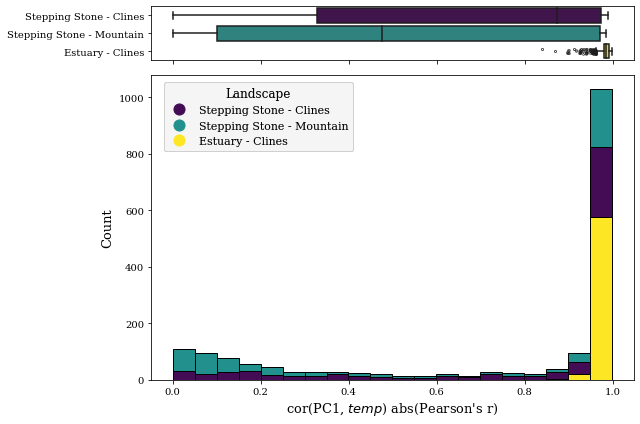

In [15]:
# the strengths of correlations between temp and PC1
stacked_bar()

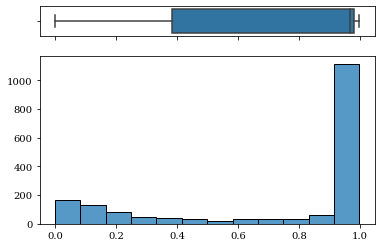

In [16]:
# the strengths of correlations between temp and PC1
ax_box, ax_hist = mf.histo_box(corr_df[corr_df['PC'] == 1]['temp_opt'].abs())

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/PC1_sal_opt_stacked_histobox.pdf


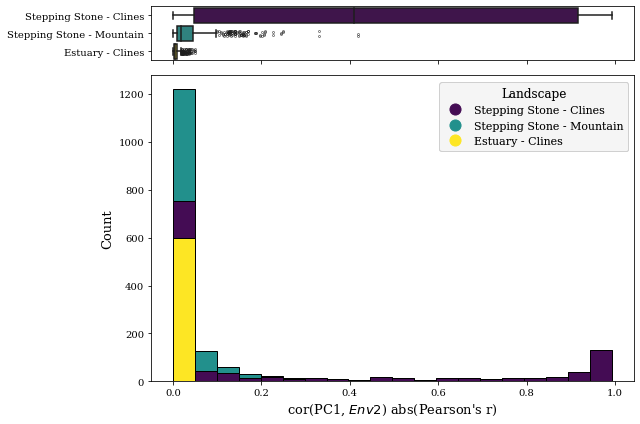

In [17]:
# the strengths of correlations between sal and PC1
stacked_bar(env='sal_opt')

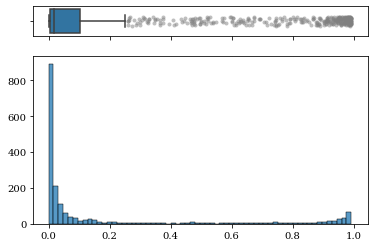

(<AxesSubplot:>, <AxesSubplot:>)

In [18]:
# the strengths of correlations between sal and PC1
mf.histo_box(
    corr_df[corr_df['PC'] == 1]['sal_opt'].abs(),
    xlim=ax_hist.get_xlim()
)

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/PC2_temp_opt_stacked_histobox.pdf


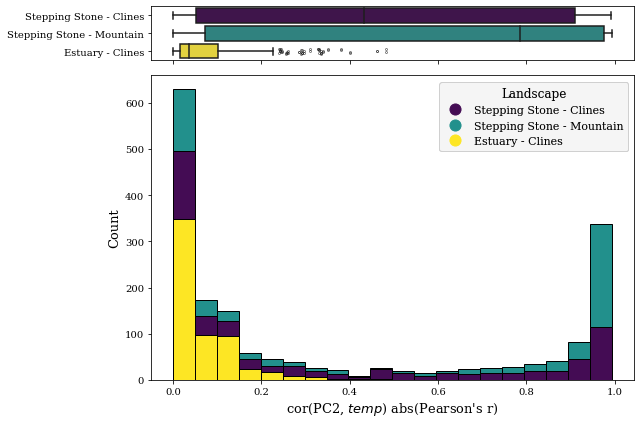

In [19]:
stacked_bar(pc=2)

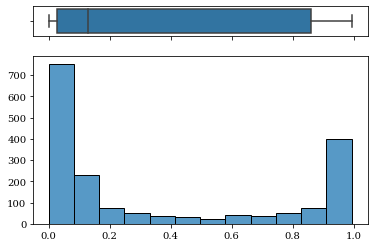

(<AxesSubplot:>, <AxesSubplot:>)

In [20]:
# the strengths of correlations between temp and PC2
mf.histo_box(
    corr_df[corr_df['PC'] == 2]['temp_opt'].abs(),
    xlim=ax_hist.get_xlim()
)

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/PC2_sal_opt_stacked_histobox.pdf


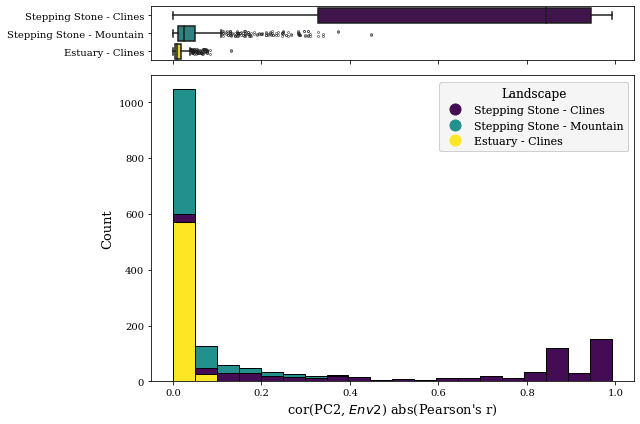

In [21]:
stacked_bar(pc=2, env='sal_opt')

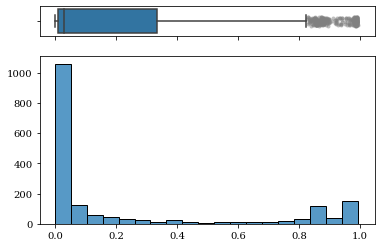

(<AxesSubplot:>, <AxesSubplot:>)

In [22]:
# the strengths of correlations between sal and PC2
mf.histo_box(
    corr_df[corr_df['PC'] == 2]['sal_opt'].abs(),
    xlim=ax_hist.get_xlim()
)

# plot correlations of envs to PC axes against each other 

In [23]:
def compare_corrs(axis, hue=None):
    """Scatter plot between sal and temp's correlation with PC `axis`.
    
    Parameters
    ----------
    axis : int
        the PC axis to use
    hue : str
        key from mvp.hue_order
    """
    fig, ax = plt.subplots(figsize=(6, 4))
    
    axis_df = corr_df[corr_df['PC'] == axis].copy()

    ax = ax.scatter(
        axis_df['sal_opt'],
        axis_df['temp_opt'],
        alpha=0.2,
        c=None if hue is None else axis_df.index.map(params[hue]).map(
            mvp.boxplot_kwargs['palette']
        )
    )

    ax.axes.set_xlabel(f"cor(PC {axis}, {fancy_env['sal_opt']}) (Pearson's r)")
    ax.axes.set_ylabel(f"cor(PC {axis}, {fancy_env['temp_opt']}) (Pearson's r)")
    
    mvp.add_legend(ax.figure, color_by=hue, bbox_to_anchor=(1, 0.55), loc='center left')
    
    plt.tight_layout()
    
    mf.save_pdf(f'{figdir}/axis-{axis}_{hue}_sal_temp_correlation_comparison.pdf')
    
    pass

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/axis-1_landscape_sal_temp_correlation_comparison.pdf


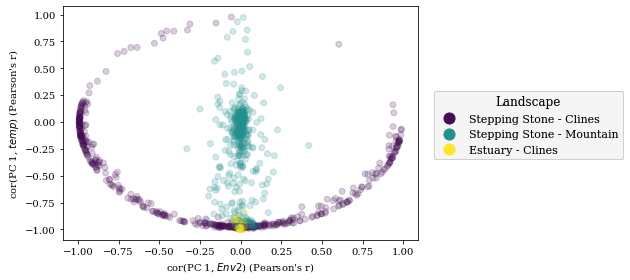

In [24]:
compare_corrs(axis=1, hue='landscape')

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/axis-2_landscape_sal_temp_correlation_comparison.pdf


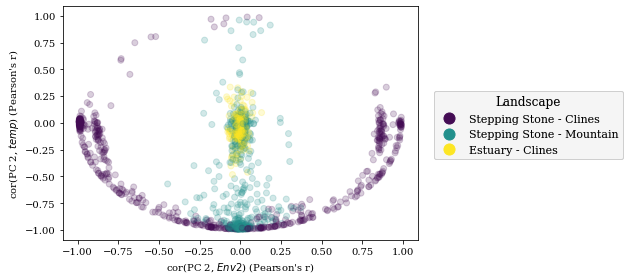

In [25]:
compare_corrs(axis=2, hue='landscape')

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/corr_PC1_vs_corr_PC2_landscape.pdf


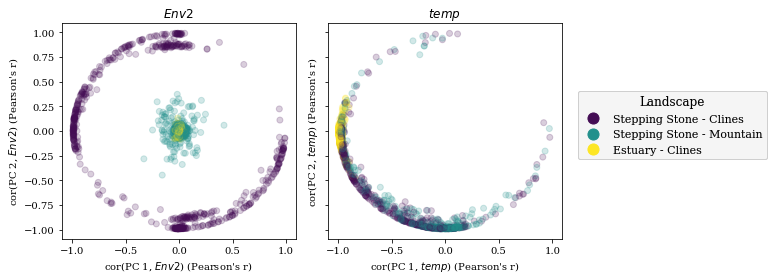

In [26]:
# is corr PC1 related to corr PC2? A: techincally, given an equation of a circle
fig, axes = plt.subplots(ncols=2, figsize=(8, 4), sharex=True, sharey=True)
for env, ax in zip(corr_df.columns[1:], axes):
    ax.scatter(
        x=corr_df[corr_df.PC==1][env],
        y=corr_df[corr_df.PC==2][env],
        c=corr_df[corr_df.PC==1].index.map(params['landscape']).map(mvp.boxplot_kwargs['palette']),
        alpha=0.2
    )

    ax.set_xlabel(f"cor(PC 1, {fancy_env[env]}) (Pearson's r)")
    ax.set_ylabel(f"cor(PC 2, {fancy_env[env]}) (Pearson's r)")
    ax.set_title(fancy_env[env])

mvp.add_legend(fig, color_by='landscape', loc='center left', bbox_to_anchor=(1, 0.55))

plt.tight_layout()

mf.save_pdf(f'{figdir}/corr_PC1_vs_corr_PC2_landscape.pdf')

plt.show()

# explore relationship of PC correlations with performance

In [27]:
# get median score from 2-trait sims using all markers
all_program_data = mvp.subset_data_scores(
    mvp.combine_level_dicts(
        use_bcs_data=True,
        num_traits=2,
    ),
    apply_median=True
)

filtering criteria:
	use_bcs_data = True
	performance = garden_performance
	num_traits = 2
	ntraits = None
	marker_set = all
	remove_structcrxn = False
	keep_nuisance = False
	remove_rda_outliers = True


reading reps: 100%|███████████████| 10/10 [00:19<00:00,  1.95s/it]


0-225
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


225-450
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


450-675
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


675-900
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


900-1125
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1125-1350
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1350-1575
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1575-1800
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


1800-2025
	 RONA num seeds =  180
	 lfmm2 num seeds =  180
	 GF num seeds =  180
	 rda num seeds =  180


2025-2250
	 RONA num seeds =  180
	 lfmm2 num seeds =  18

In [28]:
for program in all_program_data:
    print(program, all_program_data[program].shape)

RONA-sal_opt (1800,)
RONA-temp_opt (1800,)
lfmm2 (1800,)
GF (1800,)
rda-nocorr (1800,)
rda-structcorr (1800,)


In [29]:
# color map for performance scores
all_medians = flatten(all_program_data.values())
color_norm = mf.mcolors.Normalize(min(all_medians), max(all_medians))

In [30]:
# scatter but color by score, by program
cmap = cm.get_cmap('magma')

def compare_corrs(env2_pc=1, temp_pc=1):
    """Scatter plot comparing relationship between correlations of each env and PCs."""
    for program, program_data in all_program_data.items():

        fig, ax = plt.subplots(figsize=(6, 4))

        x = corr_df[corr_df['PC'] == env2_pc]['sal_opt']
        y = corr_df[corr_df['PC'] == temp_pc]['temp_opt']

        im = ax.scatter(
            x=x,
            y=y,
            alpha=0.2,
            c=[cmap(color_norm(score)) for score in x.index.map(program_data)]
        )

        ax.axes.set_xlabel(f"cor(PC {env2_pc}, %s) (Pearson's r)" % fancy_env['sal_opt'])
        ax.axes.set_ylabel(f"cor(PC {temp_pc}, %s) (Pearson's r)" % fancy_env['temp_opt'])

        ax.axes.set_title(mvp.factor_names[program])

        sm = plt.cm.ScalarMappable(cmap=cmap, norm=color_norm)
        sm.set_array([])
        cbar = ax.figure.colorbar(sm)
        cbar.ax.invert_yaxis()
        cbar.set_label("Performance (Kendall's $\\tau$)", size=13)
        mf.save_pdf(f'{figdir}/{program}_{env2_pc}_{temp_pc}_legend_scatter.pdf')
        plt.show()
        
    pass

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-sal_opt_1_1_legend_scatter.pdf


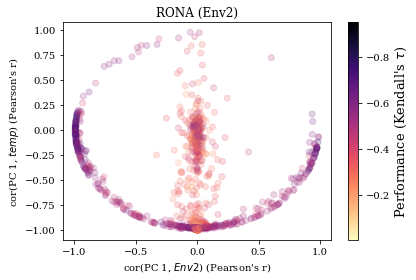

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-temp_opt_1_1_legend_scatter.pdf


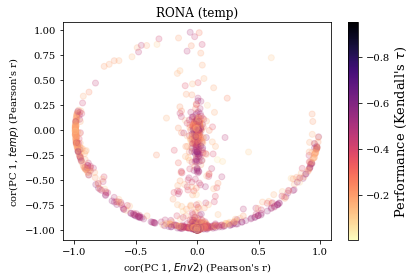

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/lfmm2_1_1_legend_scatter.pdf


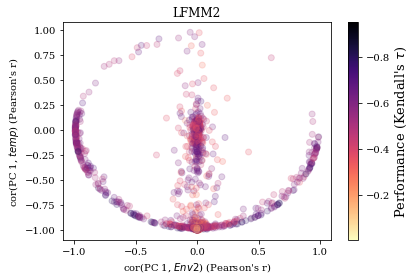

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/GF_1_1_legend_scatter.pdf


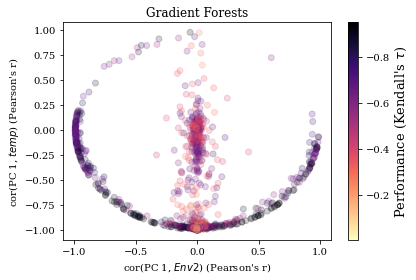

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-nocorr_1_1_legend_scatter.pdf


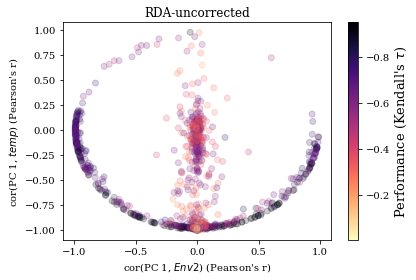

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-structcorr_1_1_legend_scatter.pdf


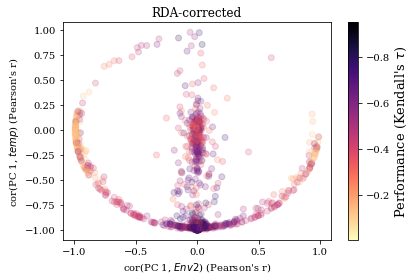

In [31]:
compare_corrs(env2_pc=1, temp_pc=1)

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-sal_opt_2_2_legend_scatter.pdf


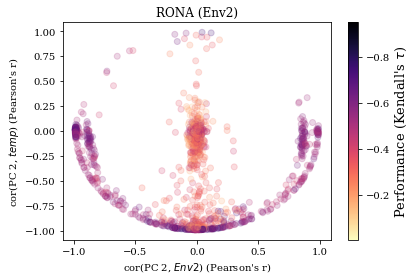

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-temp_opt_2_2_legend_scatter.pdf


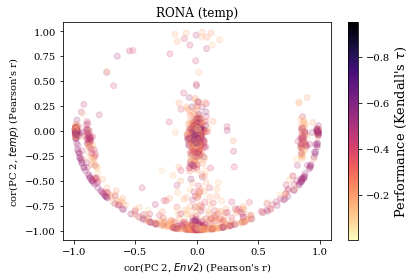

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/lfmm2_2_2_legend_scatter.pdf


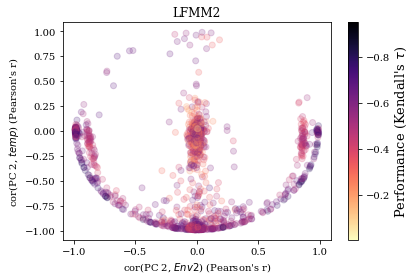

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/GF_2_2_legend_scatter.pdf


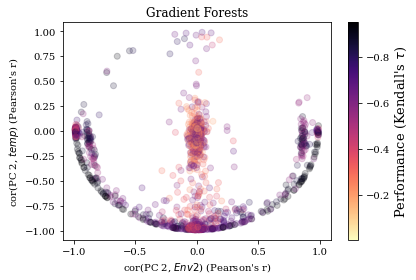

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-nocorr_2_2_legend_scatter.pdf


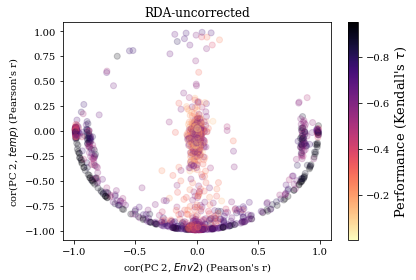

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-structcorr_2_2_legend_scatter.pdf


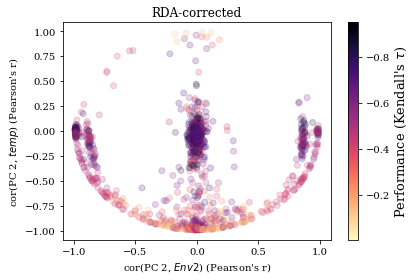

In [32]:
compare_corrs(env2_pc=2, temp_pc=2)

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-sal_opt_1_2_legend_scatter.pdf


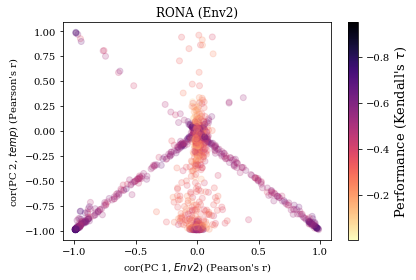

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-temp_opt_1_2_legend_scatter.pdf


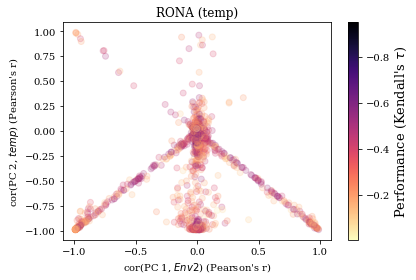

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/lfmm2_1_2_legend_scatter.pdf


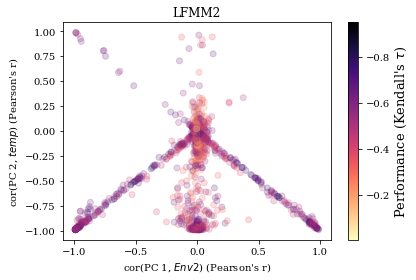

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/GF_1_2_legend_scatter.pdf


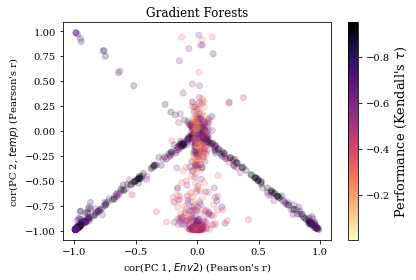

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-nocorr_1_2_legend_scatter.pdf


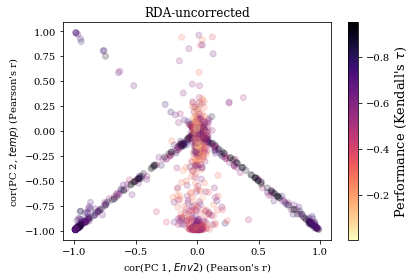

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-structcorr_1_2_legend_scatter.pdf


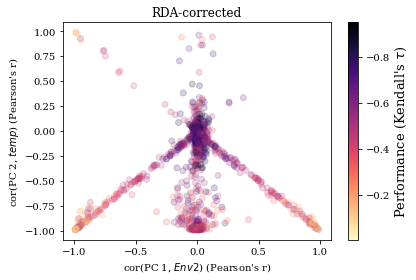

In [33]:
compare_corrs(env2_pc=1, temp_pc=2)

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-sal_opt_2_1_legend_scatter.pdf


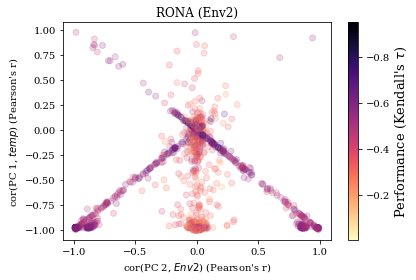

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-temp_opt_2_1_legend_scatter.pdf


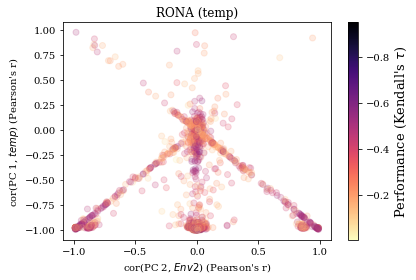

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/lfmm2_2_1_legend_scatter.pdf


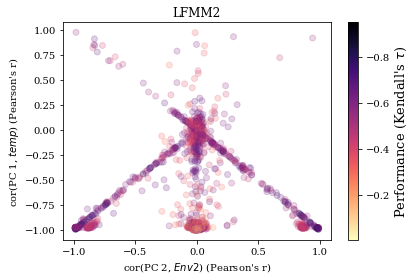

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/GF_2_1_legend_scatter.pdf


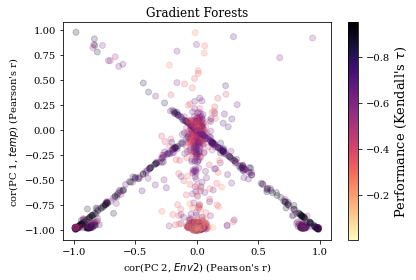

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-nocorr_2_1_legend_scatter.pdf


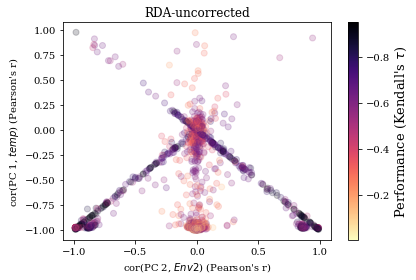

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-structcorr_2_1_legend_scatter.pdf


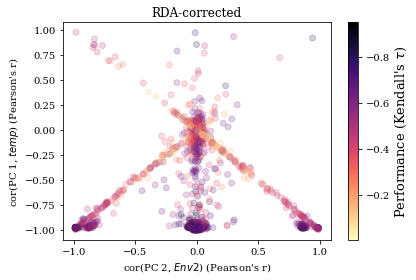

In [34]:
compare_corrs(env2_pc=2, temp_pc=1)

In [35]:
params.landscape_slevel_all.unique()

array([nan, 'Est-Clines_equal-S', 'SS-Clines_equal-S', 'SS-Mtn_equal-S',
       'Est-Clines_unequal-S', 'SS-Clines_unequal-S', 'SS-Mtn_unequal-S'],
      dtype=object)

In [36]:
# temp_pc = 1
# env2_pc = 2
def plot_diff_of_abs_cor(env2_pc=2, temp_pc=1, hue='landscape_slevel_all'):
    """
    Notes
    -----
    DO NOT do the abs(diff), positive and negative mean something here.
    """
    for program, program_data in all_program_data.items():

        x = corr_df[corr_df['PC'] == env2_pc]['sal_opt'].abs()
        y = corr_df[corr_df['PC'] == temp_pc]['temp_opt'].abs()

        diff = pd.Series(x - y, name='diff')


        fig, ax = plt.subplots(figsize=(6, 4))

        ax.scatter(diff.loc[program_data.index], program_data,
                   c=program_data.index.map(params.landscape).map(mvp.boxplot_kwargs['palette']))

        ax.invert_yaxis()
        ax.set_ylabel("Median Performance (Kendall's $\\tau$)", size=13)
        ax.set_xlabel(
            f"abs[cor(PC {env2_pc}, {fancy_env['sal_opt']})] - " + \
            f"abs[cor(PC {temp_pc}, {fancy_env['temp_opt']})]" + \
            "\n(Pearson's r)"
        )
        ax.set_title(mvp.factor_names[program])
        plt.show()
        
        lmdata = pd.merge(diff.to_frame(), program_data.to_frame(), right_index=True, left_index=True)
        lmdata[hue] = lmdata.index.map(params[hue])
#         return lmdata
        g = sns.lmplot(
            data=lmdata,
            x='diff',
            y='score',
            hue=hue,
            hue_order=mvp.hue_order[hue],
            palette=palette,
            legend=False
        )
        
        g.ax.invert_yaxis()
        g.figure.set_size_inches((6, 4))
        g.ax.set_ylabel("Median Performance (Kendall's $\\tau$)", size=13)
        g.ax.set_xlabel(
            f"abs[cor(PC {env2_pc}, {fancy_env['sal_opt']})] - " + \
            f"abs[cor(PC {temp_pc}, {fancy_env['temp_opt']})]" + \
            "\n(Pearson's r)"
        )
        g.ax.set_title(mvp.factor_names[program])
        
        change_markers(g,
                       data=lmdata,
                       hue=hue,
                       marker_map=dict(zip(params[hue], lmdata['landscape_slevel_all'])),
#                        color_map=mvp.boxplot_kwargs['palette'],
                      )
        
        mvp.add_legend(g.figure, color_by='landscape_slevel_all', use_markers=True,
                       loc='center left',
                       bbox_to_anchor=(1, 0.5))
        plt.tight_layout()
        plt.show()
    
    pass

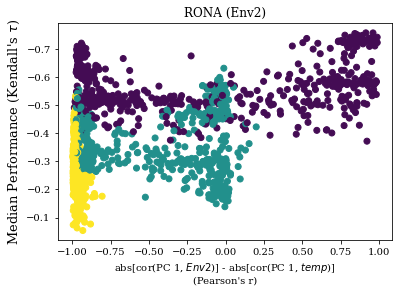

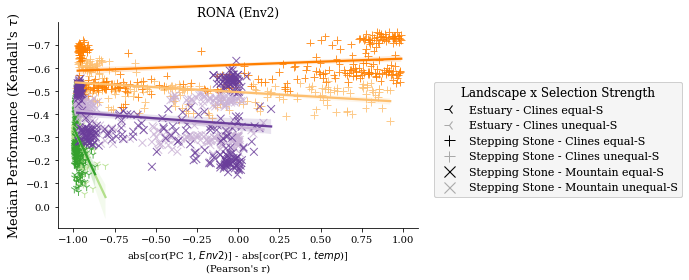

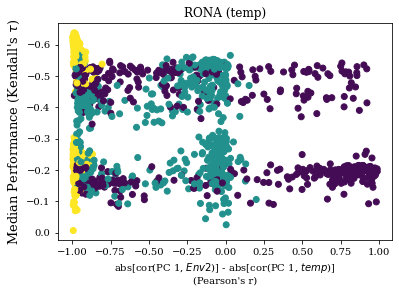

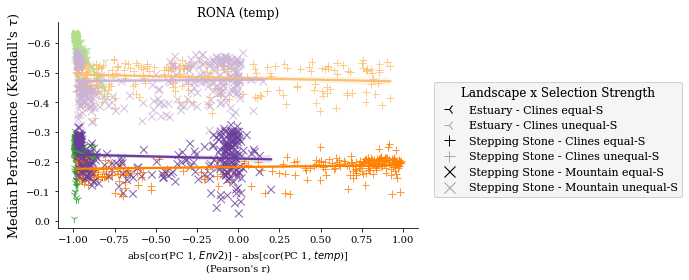

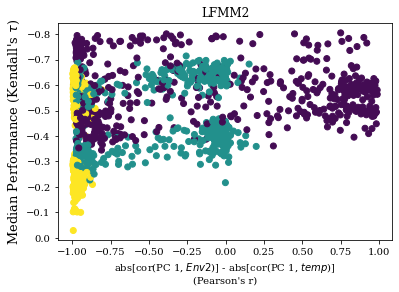

...

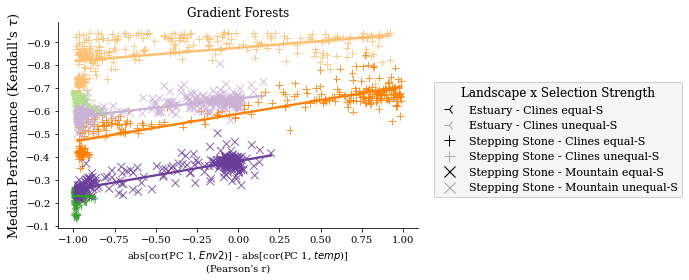

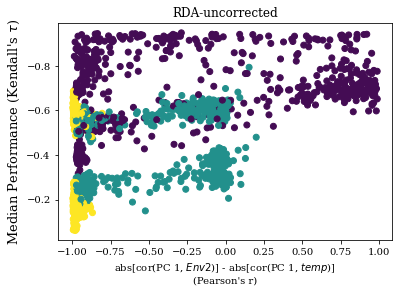

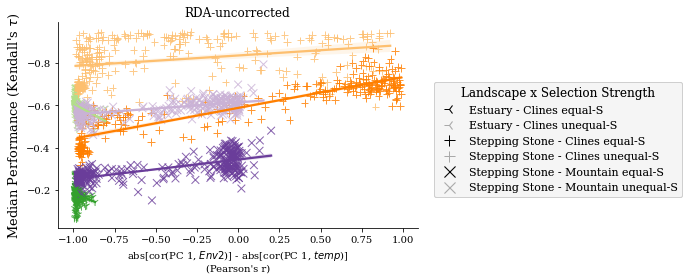

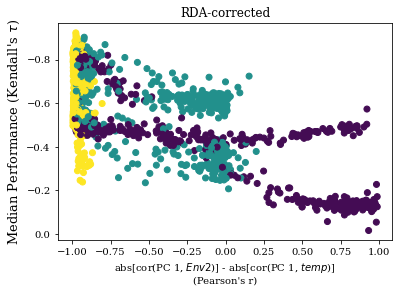

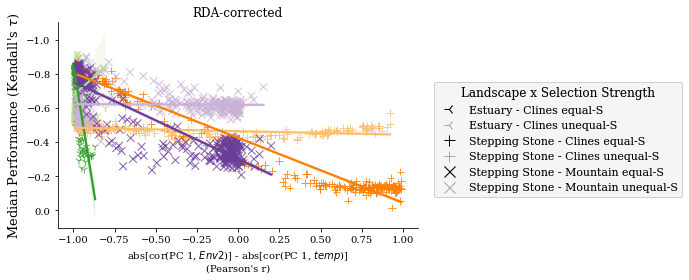

In [37]:
lmdata = plot_diff_of_abs_cor(env2_pc=1, temp_pc=1)

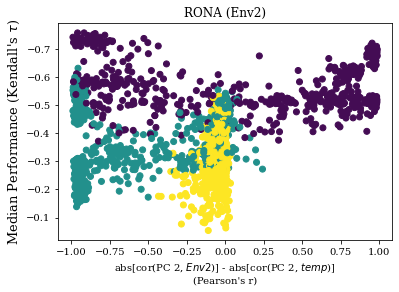

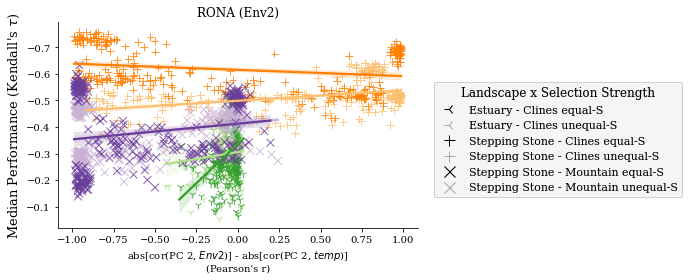

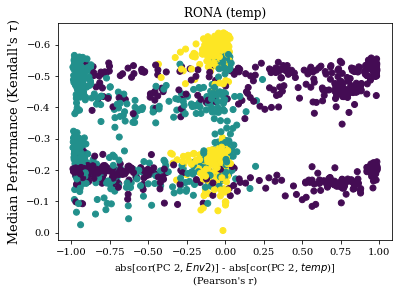

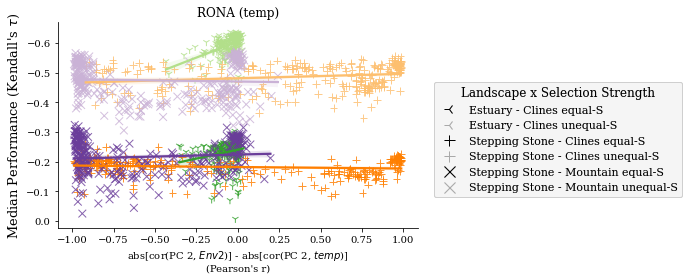

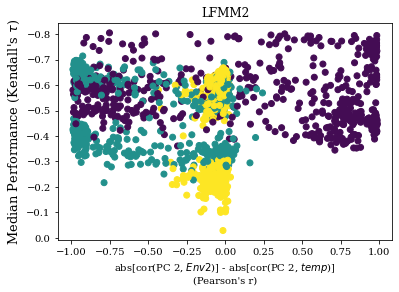

...

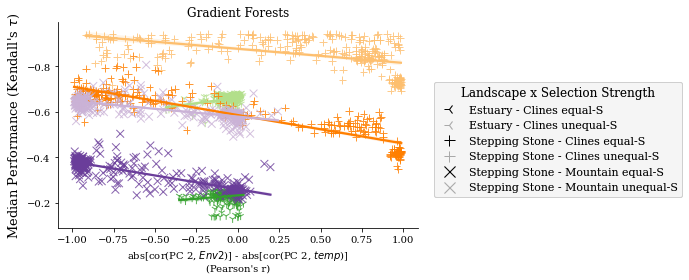

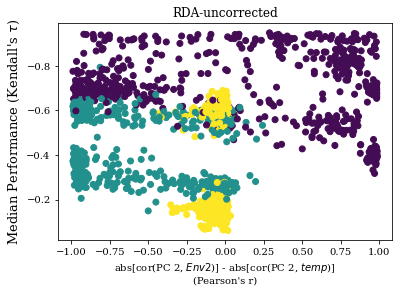

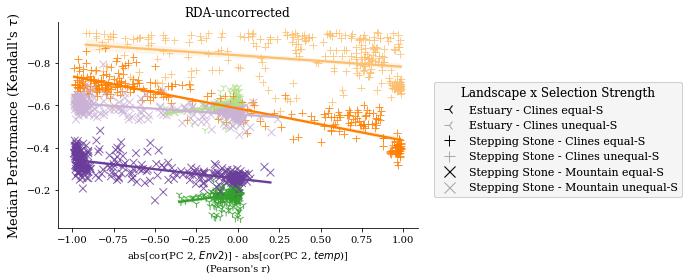

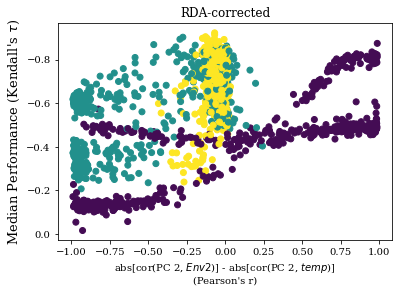

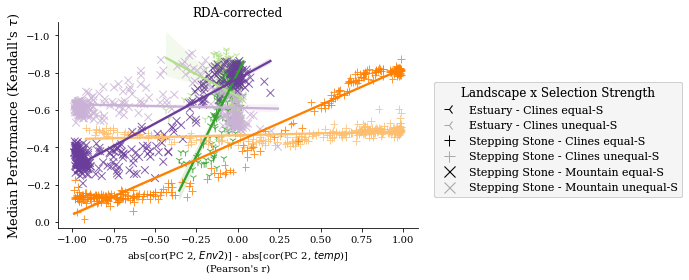

In [38]:
plot_diff_of_abs_cor(env2_pc=2, temp_pc=2)

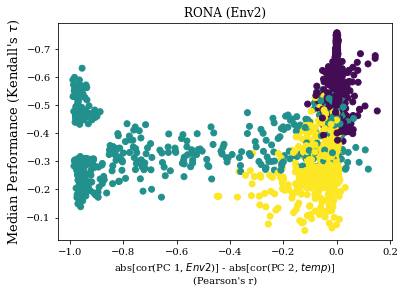

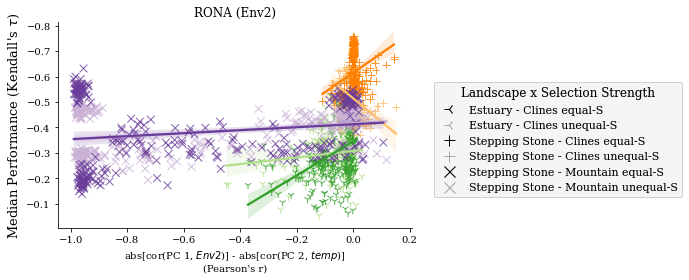

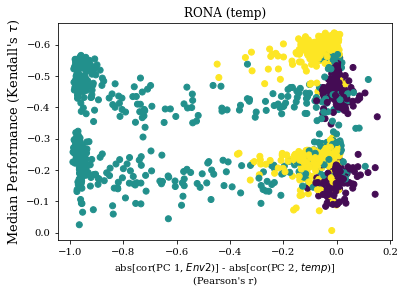

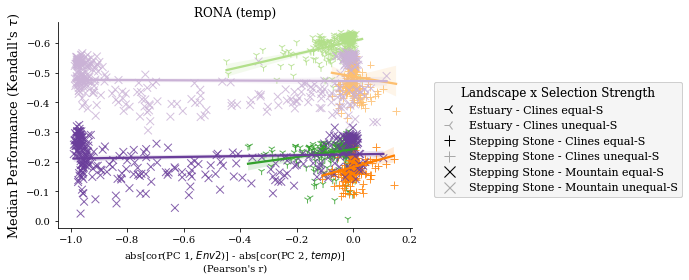

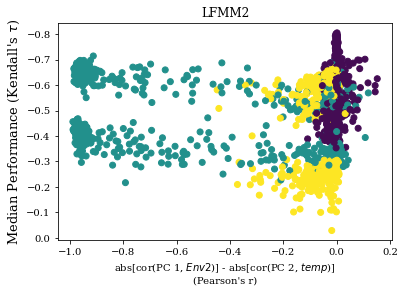

...

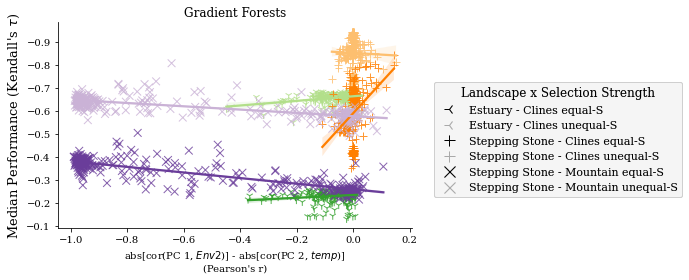

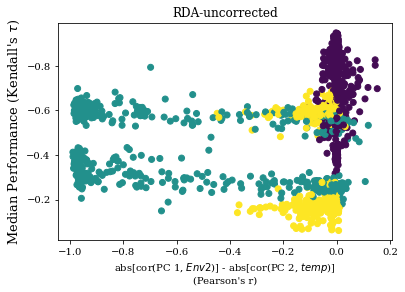

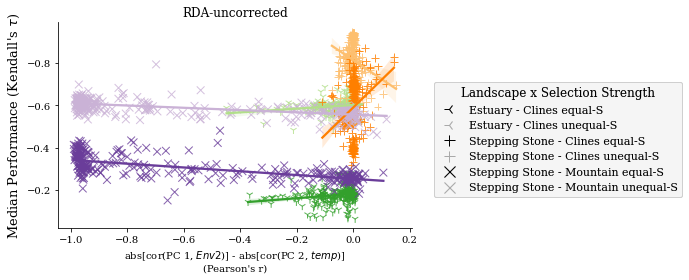

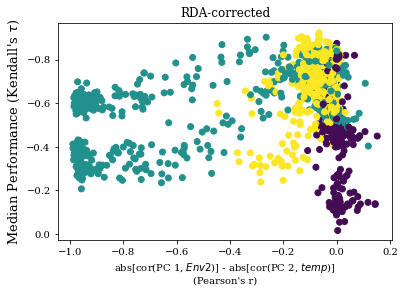

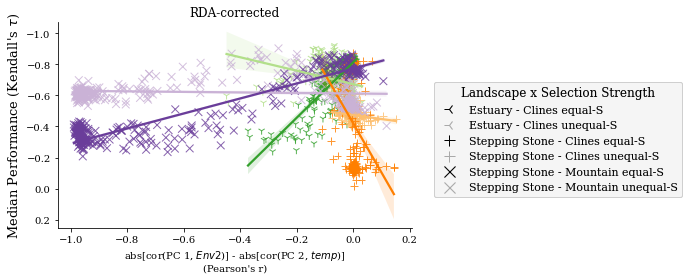

In [39]:
plot_diff_of_abs_cor(env2_pc=1, temp_pc=2)

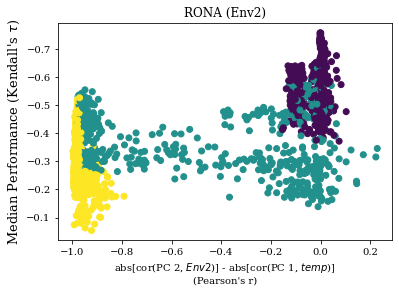

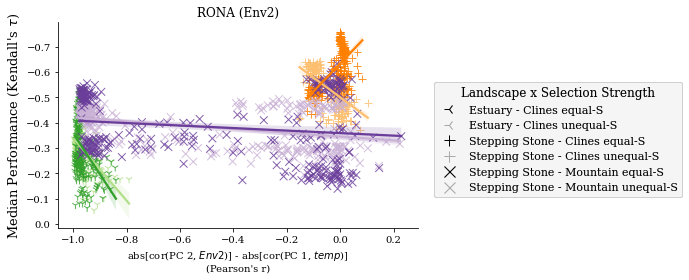

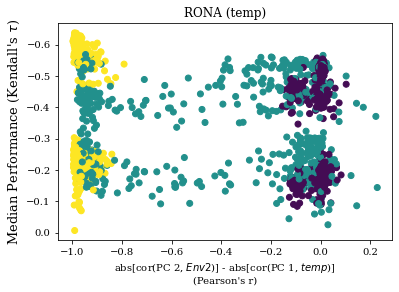

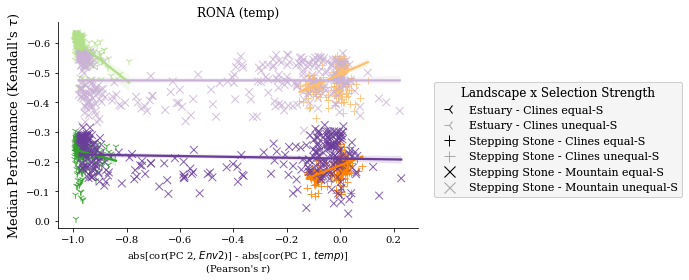

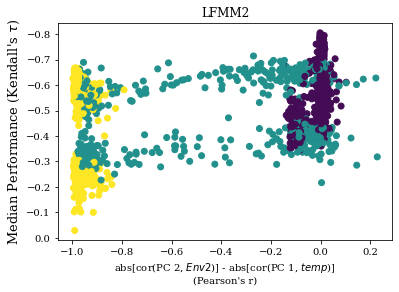

...

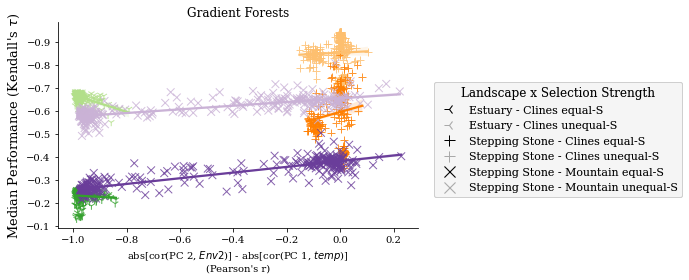

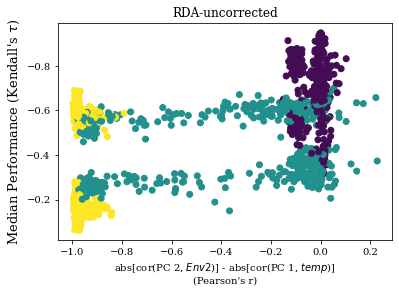

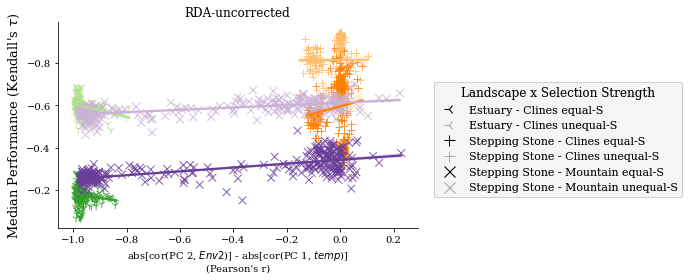

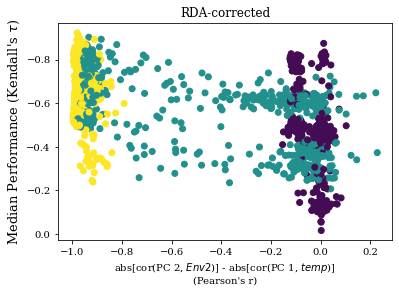

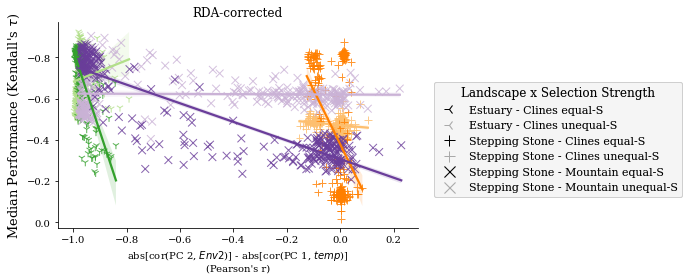

In [40]:
plot_diff_of_abs_cor(env2_pc=2, temp_pc=1)

In [41]:
def plot_score(hue=None):

    for program, program_data in all_program_data.items():

        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9, 6), sharey=True, sharex=True)
        
        axcount = 0
        for axis in [1, 2]:
            axis_df = corr_df[corr_df['PC'] == axis].copy()
            
            for env in ['temp_opt', 'sal_opt']:
                ax = axes.flat[axcount]

                im = ax.scatter(
                    x=axis_df[env],
                    y=program_data.loc[axis_df.index],
                    alpha=0.2,
                    c=None if hue is None else axis_df.index.map(params[hue]).map(
                        mvp.boxplot_kwargs['palette']
                    )
                )

                ax.axes.set_xlabel(f"cor(PC {axis}, {fancy_env[env]}) (Pearson's r)")
                ax.axes.set_ylabel("Median Performance\n(Kendall's $\\tau$)")
                
                ax.axhline(0, linestyle='--', color='gainsboro', linewidth=0.5, zorder=0)
                ax.set_ylim((-1, 0.05))
                
                axcount += 1

            if hue is not None:
                mvp.add_legend(fig, color_by=hue, loc='center left', bbox_to_anchor=(1, 0.53))
        
        ax.invert_yaxis()  # use last ax to invert
                
        fig.suptitle(mvp.factor_names[program], x=0.57)
        
        plt.tight_layout()
        
        mf.save_pdf(f'{figdir}/four-way_scatter_pc_by_median_performance_{hue}_{program}.pdf')
        plt.show()
        
    pass

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_landscape_RONA-sal_opt.pdf


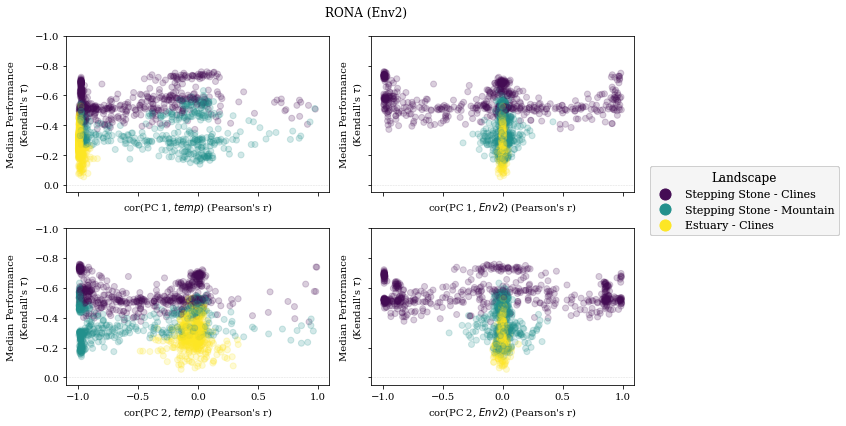

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_landscape_RONA-temp_opt.pdf


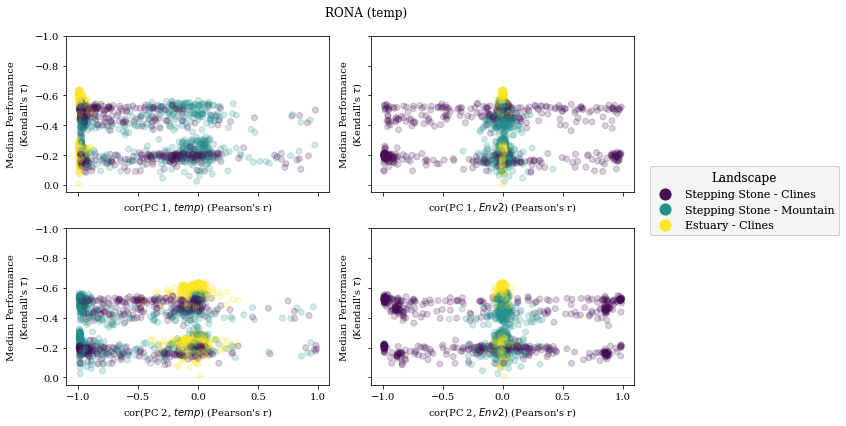

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_landscape_lfmm2.pdf


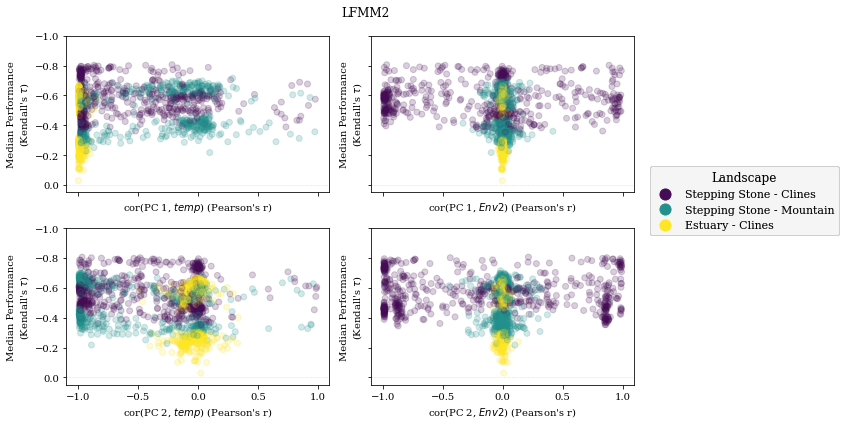

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_landscape_GF.pdf


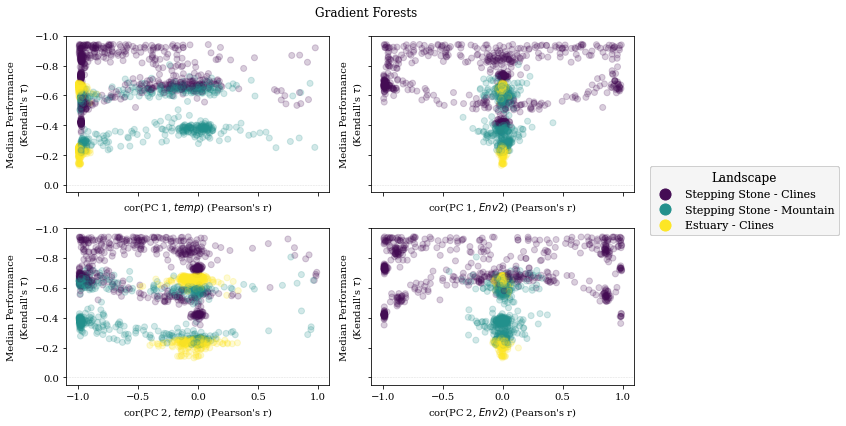

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_landscape_rda-nocorr.pdf


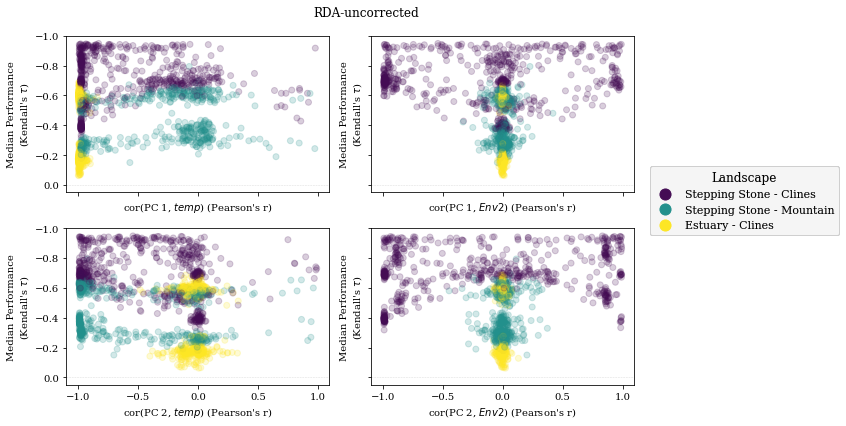

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_landscape_rda-structcorr.pdf


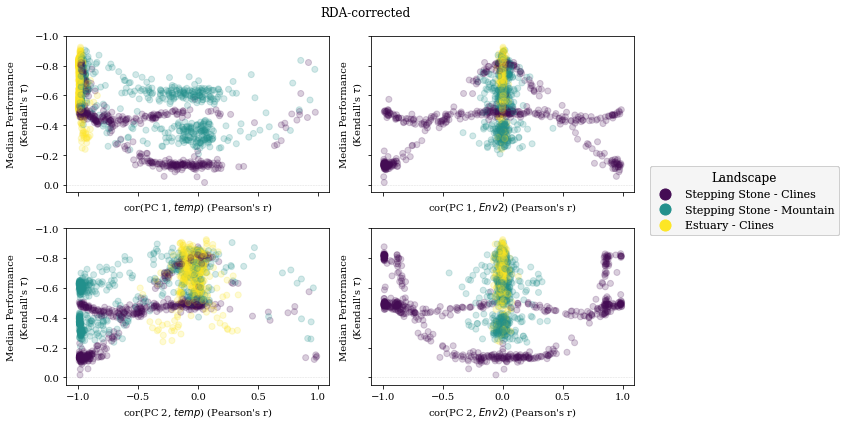

In [42]:
plot_score(hue='landscape')

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_slevel_RONA-sal_opt.pdf


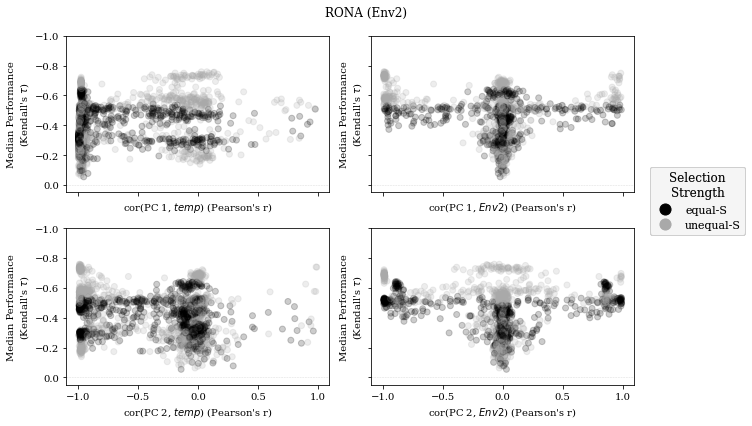

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_slevel_RONA-temp_opt.pdf


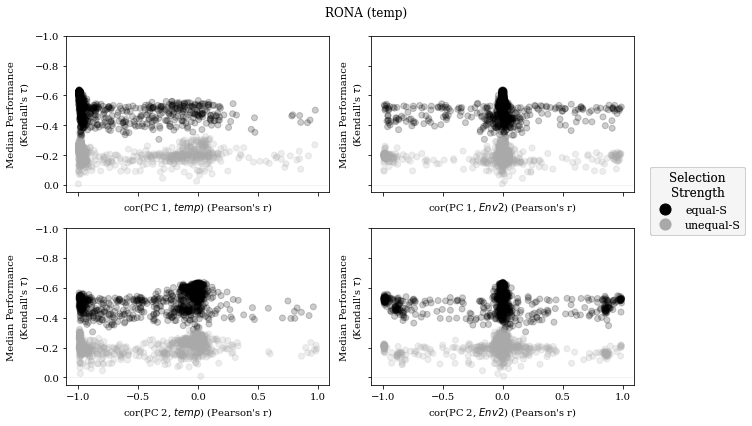

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_slevel_lfmm2.pdf


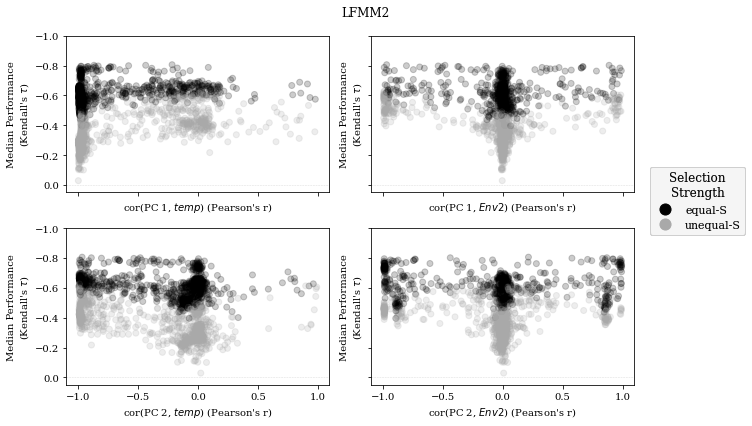

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_slevel_GF.pdf


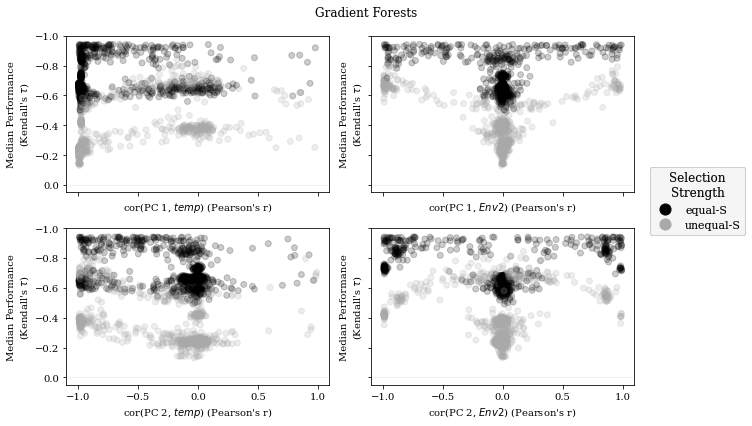

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_slevel_rda-nocorr.pdf


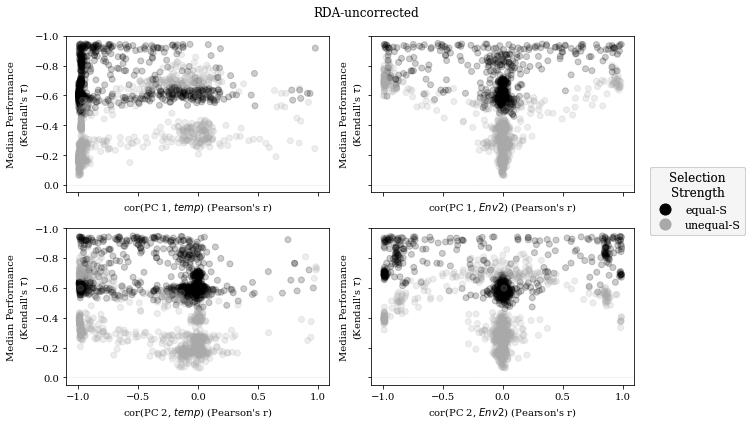

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/four-way_scatter_pc_by_median_performance_slevel_rda-structcorr.pdf


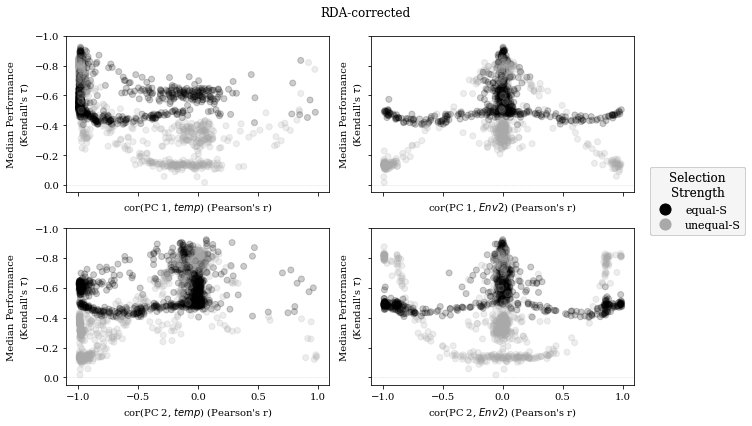

In [43]:
plot_score(hue='slevel')

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-sal_opt_abs-corr_PC1_by_performance_scatter.pdf


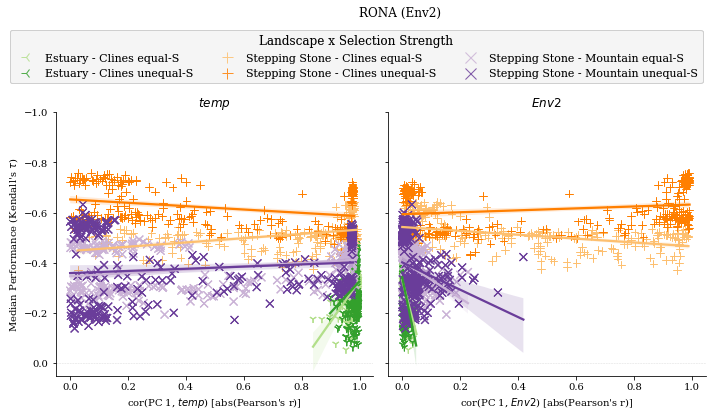

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-sal_opt_abs-corr_PC2_by_performance_scatter.pdf


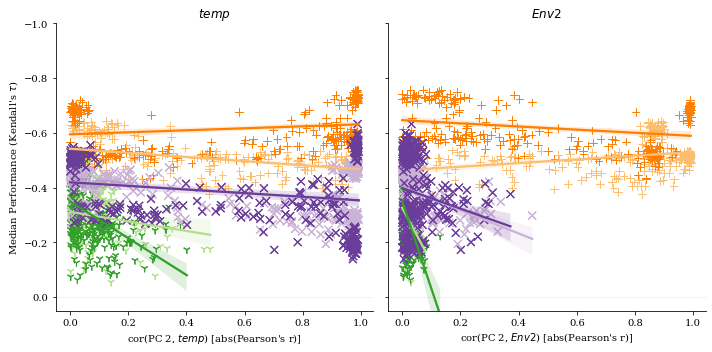

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-temp_opt_abs-corr_PC1_by_performance_scatter.pdf


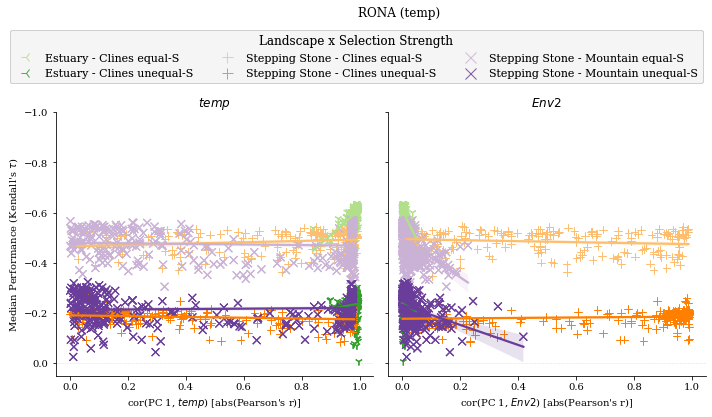

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/RONA-temp_opt_abs-corr_PC2_by_performance_scatter.pdf


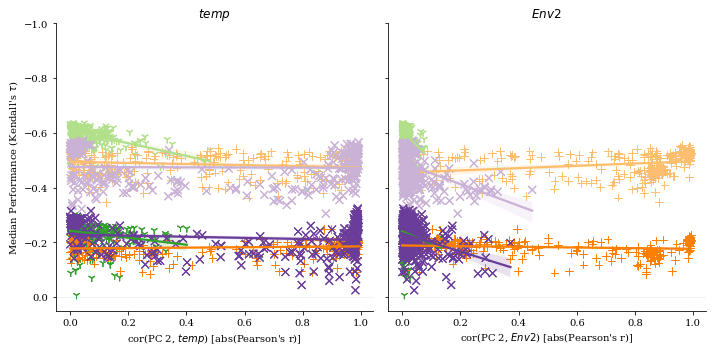

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/lfmm2_abs-corr_PC1_by_performance_scatter.pdf


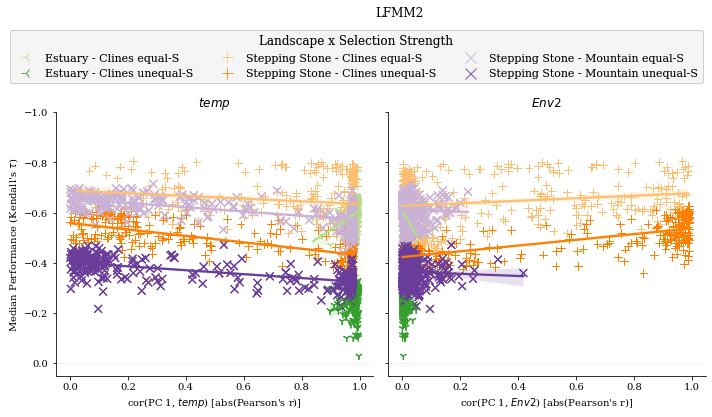

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/lfmm2_abs-corr_PC2_by_performance_scatter.pdf


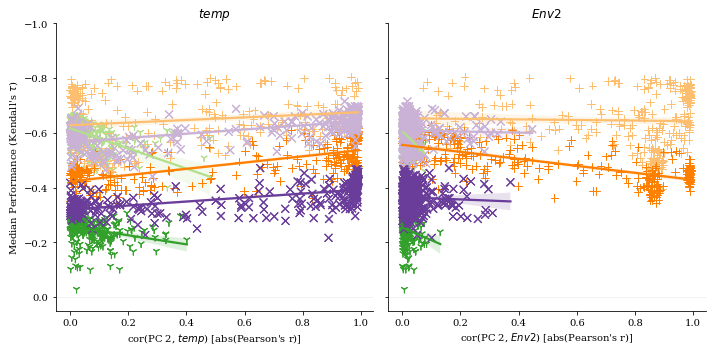

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/GF_abs-corr_PC1_by_performance_scatter.pdf


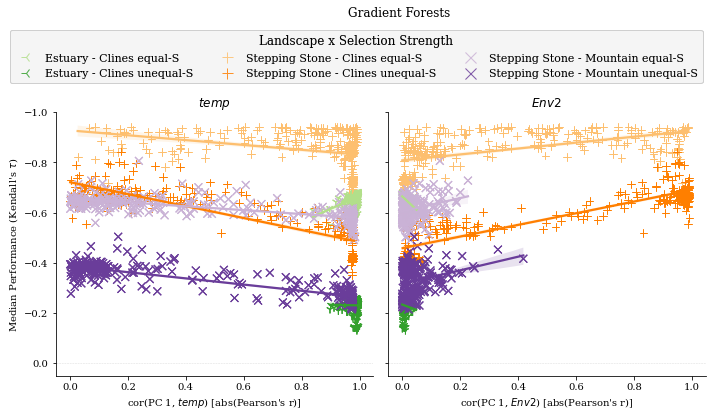

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/GF_abs-corr_PC2_by_performance_scatter.pdf


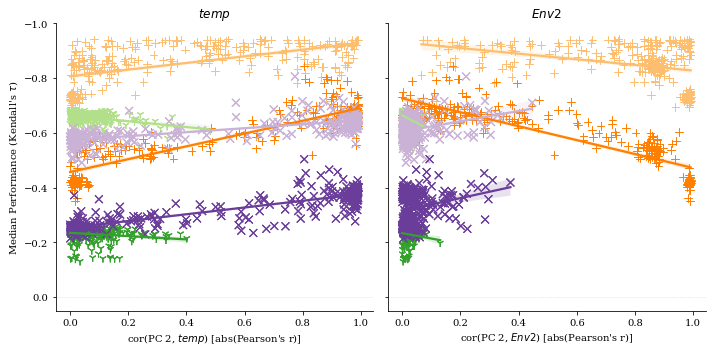

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-nocorr_abs-corr_PC1_by_performance_scatter.pdf


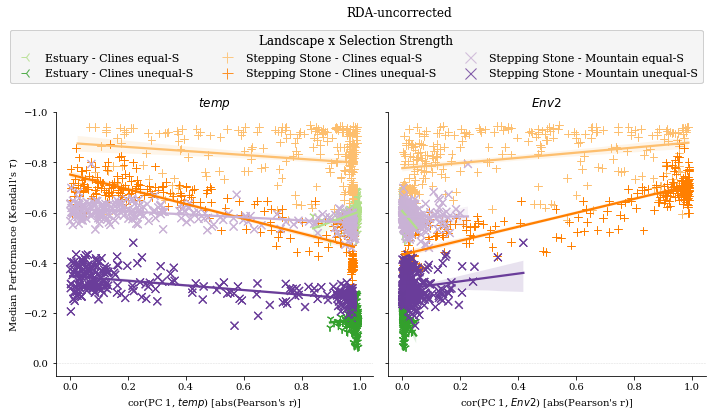

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-nocorr_abs-corr_PC2_by_performance_scatter.pdf


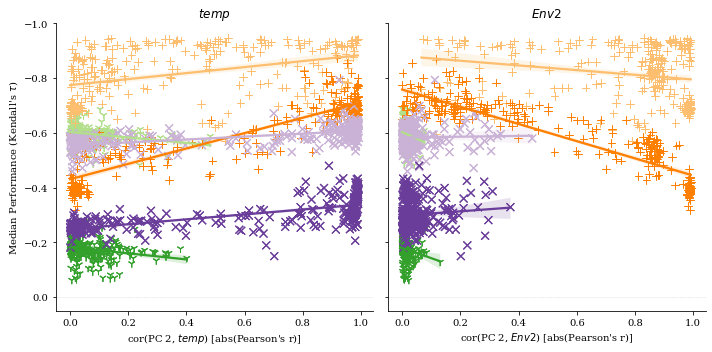

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-structcorr_abs-corr_PC1_by_performance_scatter.pdf


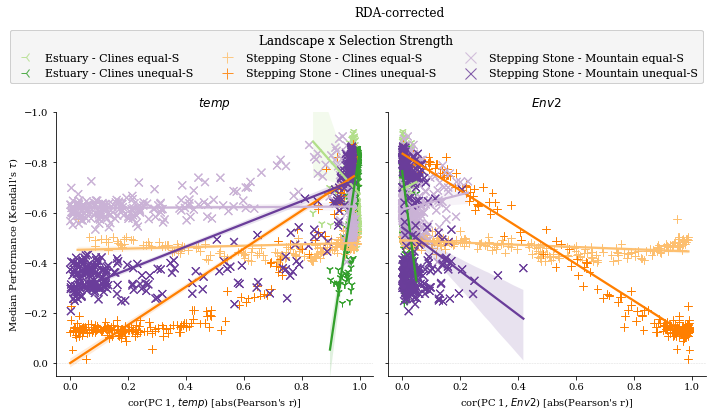

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/rda-structcorr_abs-corr_PC2_by_performance_scatter.pdf


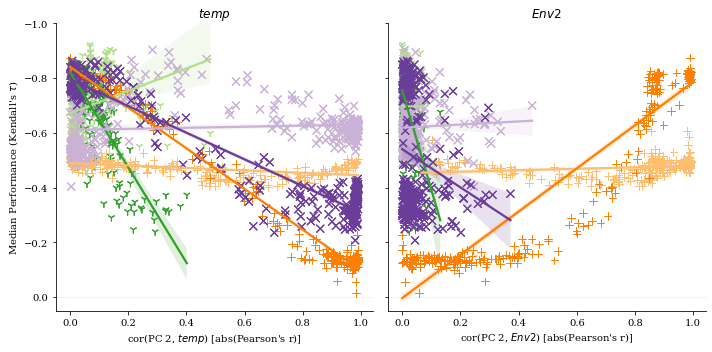

In [44]:
hue = 'landscape_slevel_all'
for program, program_data in all_program_data.items():

    abs_df = corr_df.abs().reset_index(drop=False).melt(id_vars=['PC', 'index'])
    abs_df.columns = ['PC', 'seed', 'env', 'abs(r)']
    abs_df['score'] = abs_df.seed.map(program_data)
    for param in ['landscape_slevel_all'] + keys(mvp.hue_order):
        if param in ['noncausal_env', 'program', 'marker_set', 'demography']:
            continue
        abs_df[param] = abs_df.seed.map(params[param])

    for PC in [1, 2]:
        pc_df = abs_df[abs_df.PC == PC].copy()
        
        g = sns.lmplot(
            data=pc_df,
            x='abs(r)',
            y='score',
            col='env',
            col_order=['temp_opt', 'sal_opt'],
            hue=hue,
            hue_order=sorted(pc_df[hue].unique()),
            palette=palette,
            legend=False
        )
        
        change_markers(g,
                       data=abs_df,
                       hue=hue,
                       marker_map=dict(zip(abs_df[hue], abs_df['landscape'])),
#                        color_map=mvp.boxplot_kwargs['palette'],
                      )
        
        for ax in g.axes[0]:
            env = ax.get_title().split()[-1]
            ax.set_title(fancy_env[env])
            ax.set_xlabel(f"cor(PC {PC}, {fancy_env[env]}) [abs(Pearson's r)]")
            ax.axhline(0, linestyle='--', color='gainsboro', linewidth=0.5, zorder=0)
            
        g.axes[0][0].invert_yaxis()
        g.axes[0][0].set_ylabel("Median Performance (Kendall's $\\tau$)")
        
        g.set(ylim=(0.05, -1))

        for landscape_slevel_all, pathcollection in g._legend_data.items():
            color = list(pathcollection._facecolors[0])
            mvp.boxplot_kwargs['palette'].update({landscape_slevel_all : color})
#             print(ColorText(landscape_slevel_all).custom(color).bold())
        
        if PC == 1:
            g.figure.suptitle(mvp.factor_names[program], x=0.56, y=1.15, ha='center')
            mvp.add_legend(g.figure, color_by='landscape_slevel_all', use_markers=True,
                           loc='upper center',
                           bbox_to_anchor=(0.5, 1.1), ncol=3)
            
        plt.tight_layout()
        
        mf.save_pdf(f'{figdir}/{program}_abs-corr_PC{PC}_by_performance_scatter.pdf')
        
        plt.show()


### cor(PC, env) by proportion of clinal loci

In [45]:
# get proportion of clinal allele categories for each replicate
summary = mvp.get_summary_data()

clinal_cats = [
    col for col in summary if 'cor_fpr' in col.lower()
] + [col for col in summary if 'cor_tpr' in col.lower()]

clinal_cats

['cor_FPR_temp_neutSNPs',
 'cor_FPR_sal_neutSNPs',
 'cor_TPR_temp',
 'cor_TPR_sal']

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/abs_corr_PC1_vs_cor_FPR_temp_neutSNPs.pdf


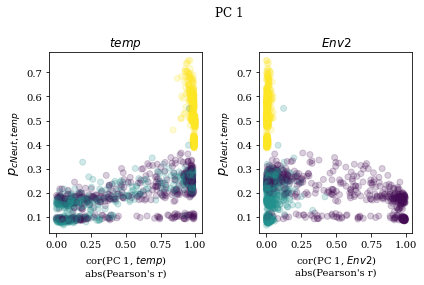

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/abs_corr_PC1_vs_cor_FPR_sal_neutSNPs.pdf


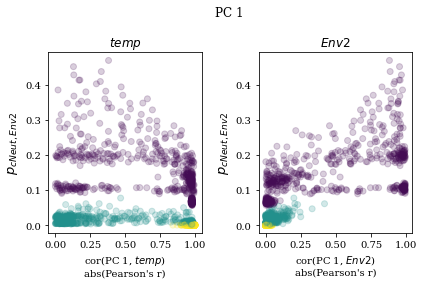

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/abs_corr_PC1_vs_cor_TPR_temp.pdf


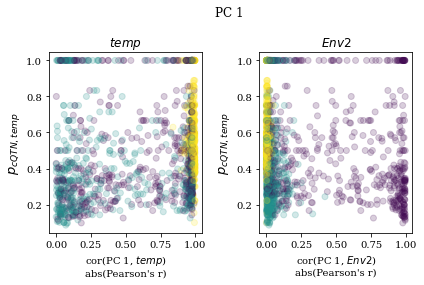

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/abs_corr_PC1_vs_cor_TPR_sal.pdf


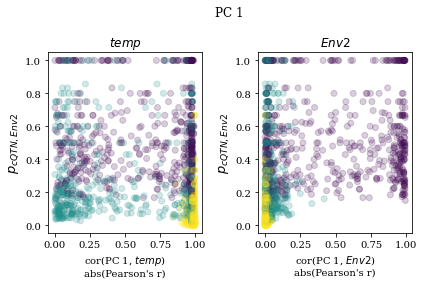

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/abs_corr_PC2_vs_cor_FPR_temp_neutSNPs.pdf


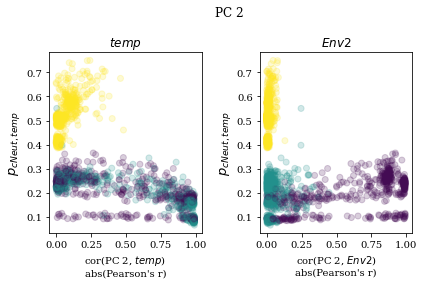

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/abs_corr_PC2_vs_cor_FPR_sal_neutSNPs.pdf


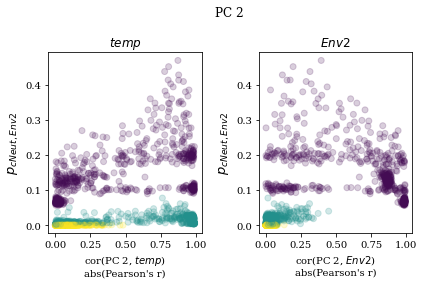

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/abs_corr_PC2_vs_cor_TPR_temp.pdf


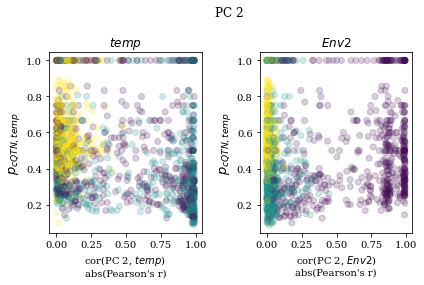

Saved to:  /home/b.lind/offsets/run_20220919/summaries/10_supplemental/03_PC_correlations/abs_corr_PC2_vs_cor_TPR_sal.pdf


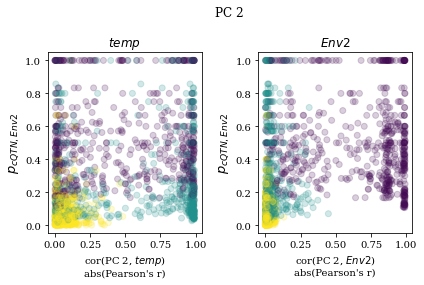

In [46]:
# plot correlation between cor(env, PC) and proportion of clinal alleles
for PC in [1, 2]:
    data = corr_df[(corr_df.PC == PC)].copy()
    for cat in clinal_cats:
        data[cat] = data.index.map(summary[cat])
        
        fig, (axes) = plt.subplots(ncols=2, figsize=(6, 4))
        for i, env in enumerate(['temp_opt', 'sal_opt']):
            axes[i].scatter(data[env].abs(),
                            data[cat],
                            c=data.index.map(params.landscape).map(mvp.boxplot_kwargs['palette']),
                            alpha=0.2
                           )
            axes[i].set_xlabel(f"cor(PC {PC}, {fancy_env[env]})\nabs(Pearson's r)")
            axes[i].set_ylabel(mvp.factor_names[cat], fontsize=13)
            axes[i].set_title(fancy_env[env])
        fig.suptitle(f"PC {PC}", x=0.54)
        plt.tight_layout()
        mf.save_pdf(f'{figdir}/abs_corr_PC{PC}_vs_{cat}.pdf')
        plt.show()

# histograms of perc explained

In [47]:
# get a list of files that have `PC % variation explained`
pca_dirs = fs('/work/lotterhos/MVP-NonClinalAF/sim_output_20220428', endswith='.pca')

perc_files = []
for d in pca_dirs:
    seed = op.basename(d).split("_")[0]
    perc_files.append(
        f'{d}/{seed}_genotypes.tracywidom'
    )

In [48]:
percs = defaultdict(dict)
for p in pbar(perc_files):
    df = pd.read_table(p, delim_whitespace=True)
    
    seed = op.basename(p).split("_")[0]
    
    for PC in df.N[:2]:
        percs[seed][PC] = df.loc[PC, 'percentage']
        
seed

100%|███████████████| 2250/2250 [00:13<00:00, 170.18it/s]


'1233343'

In [49]:
perc_df = pd.DataFrame(percs)

perc_df

,1231094,1231095,1231096,1231097,1231098,1231099,1231100,1231101,1231102,1231103,1231104,1231105,1231106,1231107,1231108,1231109,1231110,1231111,1231112,1231113,1231114,1231115,1231116,1231117,1231118,1231119,1231120,1231121,1231122,1231123,1231124,1231125,1231126,1231127,1231128,1231129,1231130,1231131,1231132,1231133,1231134,1231135,1231136,1231137,1231138,1231139,1231140,1231141,1231142,1231143,...,1233294,1233295,1233296,1233297,1233298,1233299,1233300,1233301,1233302,1233303,1233304,1233305,1233306,1233307,1233308,1233309,1233310,1233311,1233312,1233313,1233314,1233315,1233316,1233317,1233318,1233319,1233320,1233321,1233322,1233323,1233324,1233325,1233326,1233327,1233328,1233329,1233330,1233331,1233332,1233333,1233334,1233335,1233336,1233337,1233338,1233339,1233340,1233341,1233342,1233343
1,0.12400,0.11030,0.17480,0.12020,0.13810,0.1446,0.13270,0.09373,0.12670,0.14590,0.1455,0.15810,0.09736,0.12340,0.16810,0.11780,0.1080,0.16030,0.11120,0.1249,0.1671,0.17560,0.11090,0.14480,0.14440,0.1588,0.17620,0.11410,0.13490,0.13360,0.11600,0.09747,0.15960,0.10570,0.11300,0.1544,0.16470,0.11200,0.12920,0.1242,0.1489,0.16850,0.11910,0.12640,0.16090,0.1243,0.11650,0.16160,0.10580,0.14000,...,0.1429,0.17910,0.12380,0.13260,0.14380,0.11000,0.09920,0.17710,0.10630,0.10240,0.15260,0.17920,0.11590,0.13120,0.12330,0.1440,0.15480,0.12670,0.12670,0.11520,0.11480,0.10280,0.16530,0.10150,0.1221,0.1678,0.15560,0.1094,0.13650,0.15790,0.1526,0.15830,0.11180,0.1377,0.1284,0.1253,0.09123,0.15260,0.10860,0.12740,0.1551,0.1715,0.11620,0.13130,0.16470,0.1428,0.15490,0.12380,0.12740,0.12690
2,0.07054,0.05898,0.05662,0.06857,0.07854,0.1028,0.06662,0.08977,0.07515,0.06914,0.1132,0.06023,0.08546,0.07506,0.06628,0.06648,0.0618,0.05643,0.06858,0.0809,0.1049,0.06209,0.08702,0.07762,0.08673,0.1112,0.07751,0.08325,0.07782,0.08527,0.06906,0.08283,0.05334,0.06378,0.08612,0.1059,0.07479,0.08328,0.07542,0.1151,0.1061,0.07543,0.08325,0.07331,0.07872,0.0684,0.06696,0.05474,0.06602,0.09325,...,0.1093,0.07474,0.07964,0.07501,0.07734,0.06723,0.06802,0.05215,0.06562,0.05953,0.09912,0.06794,0.08874,0.07143,0.08094,0.1056,0.08344,0.07909,0.07127,0.08812,0.07065,0.06132,0.05468,0.06768,0.0736,0.1172,0.06186,0.0856,0.07652,0.08166,0.1032,0.07127,0.08383,0.0756,0.1034,0.0710,0.06817,0.05417,0.06294,0.08361,0.1063,0.0647,0.08085,0.07673,0.06907,0.1008,0.09134,0.08374,0.07912,0.08483


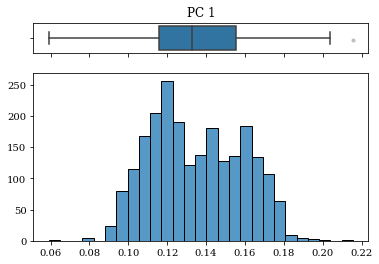

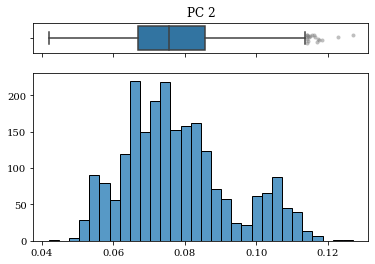

(<AxesSubplot:>, <AxesSubplot:title={'center':'PC 2'}>)

In [50]:
mf.histo_box(perc_df.loc[1], title='PC 1')

mf.histo_box(perc_df.loc[2], title='PC 2')

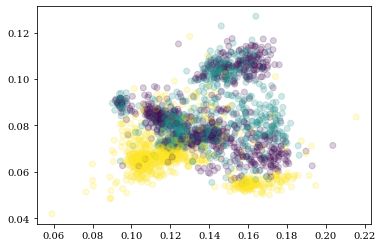

In [51]:
im = plt.scatter(
    perc_df.loc[1],
    perc_df.loc[2],
    c=perc_df.columns.map(params['landscape']).map(mvp.boxplot_kwargs['palette']),
    alpha=0.2
)

In [52]:
formatclock(dt.now() - t0)

'0-00:02:43'